# Shoaling Neighborhood Maps

Focused analysis notebook for neighborhood-density maps from processed shoaling-selection data. The notebook reuses the processed summaries and map files on the NAS when they already exist.

## Settings

In [1]:
from pathlib import Path
import os

repo_candidate = Path.cwd()
if repo_candidate.name == 'Analyses':
    repo_candidate = repo_candidate.parent

CODE_DIR = Path(os.environ.get('JLSOCIALBEHAVIOR_CODE_DIR', repo_candidate)).resolve()
META_FOLDER = '//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/07_Data/Carlos/Behavior/ShoalingSelection/'
META_FILE = 'MetaData_CR.xlsx'
PROCESSING_ROOT_DIR = '//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/'
PROCESSING_DIR = os.path.join(PROCESSING_ROOT_DIR, 'ShoalMaps_temp_processing')
OUTPUT_DIR = '//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/'

# Main data selection controls. Set INCLUDE_YEARS = None to use all years.
DATASET_LABEL = 'selection'
INCLUDE_YEARS = [2026]
INCLUDE_LINES = None
INCLUDE_GENOTYPES = None
INCLUDE_LINESETS = None
INCLUDE_EXPERIMENT_FOLDERS = None
EXCLUDE_EXPERIMENT_FOLDERS = []

# Processed-data discovery and optional rerun controls.
FORCE_PROCESSING = False
PROCESSING_MISSING_ONLY = True
PROCESSING_SETTINGS_CSV = os.path.join(PROCESSING_DIR, 'processingSettings_neighborhood_maps.csv')

# These mirror the slim selection notebook, except SaveNeighborhoodMaps must be 1 for map output.
EPISODE_DURATION_MIN = 5
N_EPISODES = 24
FPS = 30
READ_LIM = N_EPISODES * EPISODE_DURATION_MIN * 60 * FPS + 11
IN_DISH_MIN = 80
IN_DISH_MAX = 240
ARENA_DIAMETER_MM = 70
MIN_SHIFT_SECONDS = 60
RECOMPUTE_ANIMAL_SIZE = 1
COMPUTE_BOUTS = 1
SAVE_NEIGHBORHOOD_MAPS = 1

# MapData axis controls. Map type 0 is the neighborhood-density map.
MAP_TYPE_INDEX = 0
MAP_TYPE_LABELS = {0: 'Neighbor density', 1: 'Speed force', 2: 'Turn force'}
SUMMARY_ANIMAL_INDEX_BASE = 0
GROUP_COLUMNS = ['genotype', 'episode']
MAP_EXTENT_MM = (-30, 30, -30, 30)
REAL_CLIM = (0, 2)
DIFF_CLIM = (-0.75, 0.75)

os.makedirs(PROCESSING_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.chdir(CODE_DIR)
print('Using repository:', CODE_DIR)
print('Using notebook processing cache:', PROCESSING_DIR)
print('Writing notebook outputs to:', OUTPUT_DIR)


Using repository: C:\Users\crodri19\larschpostdoc_analyses\selection_shoaling\jlsocialbehavior
Using notebook processing cache: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_processing
Writing notebook outputs to: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/


## Imports

In [16]:
import glob
import math
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

%config InteractiveShellApp.pylab_import_all = False
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import functions.matrixUtilities_joh as mu
import models.experiment_set as es
import functions.paperFigureProps as pfp

import textwrap

pfp.paper()

using plot settings for paper plots
standard figure sizes 
 figSq:  (5, 5) 
 figLs:  (5, 3) 
 figPt:  (3, 5)


## Helper Functions

In [3]:
def parse_an_numbers(value):
    text = str(value).strip()
    if not text or text.lower() == 'nan':
        return []
    if ':' in text:
        start, stop = text.split(':', 1)
        return list(range(int(start), int(stop) + 1))
    return [int(x) for x in text.split()]


def find_first(folder, pattern):
    matches = sorted(glob.glob(os.path.join(folder, pattern)))
    return matches[0] if matches else None


def as_filter_set(values):
    if values is None:
        return None
    return set(values)


def intersects(values, allowed):
    if allowed is None:
        return True
    return bool(set(values) & allowed)


def join_label(values):
    values = [str(x) for x in values if pd.notna(x)]
    return ', '.join(sorted(set(values)))


def mode_or_first(values):
    clean = pd.Series(values).dropna()
    if clean.empty:
        return np.nan
    modes = clean.mode()
    return modes.iloc[0] if not modes.empty else clean.iloc[0]


def map_summary_paths(txt_path):
    basename = mu.splitall(txt_path)[-1][:-4]
    summary_matches = sorted(glob.glob(os.path.join(PROCESSING_DIR, basename + '*siSummary*.csv')))
    map_matches = sorted(glob.glob(os.path.join(PROCESSING_DIR, basename + '*MapData.npy')))
    return basename, summary_matches, map_matches


def remap_summary_animal_ids(summary, animal_ids):
    summary = summary.copy()
    local_index = summary['animalIndex'].astype(int) - SUMMARY_ANIMAL_INDEX_BASE
    animal_ids = np.asarray(animal_ids)
    valid = (local_index >= 0) & (local_index < len(animal_ids))
    summary['animalIndex_local'] = local_index
    summary.loc[valid, 'animalIndex'] = animal_ids[local_index[valid]]
    summary.loc[~valid, 'animalIndex'] = np.nan
    return summary


def stack_mean(maps):
    maps = [m for m in maps if isinstance(m, np.ndarray)]
    if not maps:
        return None
    return np.nanmean(np.stack(maps, axis=0), axis=0)


def group_label(row, columns):
    return ' | '.join([f'{col}={row[col]}' for col in columns])

## Load Metadata And Select Experiments

In [4]:
meta_path = os.path.join(META_FOLDER, META_FILE)
info_raw = pd.read_excel(meta_path, sheet_name='AllExp')
infoAn = pd.read_excel(meta_path, sheet_name='AllAn')
infoAn['bd'] = pd.to_datetime(infoAn['bd'], format='%d-%m-%Y', dayfirst=True, errors='coerce')
infoAn['expDate'] = pd.to_datetime(infoAn['expDate'], format='%d-%m-%Y', dayfirst=True, errors='coerce')

year_filter = as_filter_set(INCLUDE_YEARS)
line_filter = as_filter_set(INCLUDE_LINES)
genotype_filter = as_filter_set(INCLUDE_GENOTYPES)
lineset_filter = as_filter_set(INCLUDE_LINESETS)
include_folder_filter = as_filter_set(INCLUDE_EXPERIMENT_FOLDERS)
exclude_folder_filter = as_filter_set(EXCLUDE_EXPERIMENT_FOLDERS)

records = []
missing_paths = []
cam_height = [105, 180]

for index, row in info_raw.iterrows():
    folder_label = str(row.get('folder', ''))
    if include_folder_filter is not None and folder_label not in include_folder_filter:
        continue
    if exclude_folder_filter is not None and folder_label in exclude_folder_filter:
        continue

    animal_ids = parse_an_numbers(row.get('anNr', ''))
    animals = infoAn[infoAn['anNr'].isin(animal_ids)].copy()
    years = sorted(animals['expDate'].dropna().dt.year.unique())
    lines = sorted(animals['line'].dropna().astype(str).unique()) if 'line' in animals else []
    genotypes = sorted(animals['genotype'].dropna().astype(str).unique()) if 'genotype' in animals else []
    line_sets = sorted({f'{line}_{row.get("date", "")}' for line in lines})

    if not intersects(years, year_filter):
        continue
    if not intersects(lines, line_filter):
        continue
    if not intersects(genotypes, genotype_filter):
        continue
    if not intersects(line_sets, lineset_filter):
        continue

    start_dir = os.path.join(str(row.path), folder_label)
    txt_path = find_first(start_dir, 'PositionTxt*')
    pair_list = find_first(start_dir, 'PL*')
    if txt_path is None or pair_list is None:
        missing_paths.append({'folder': folder_label, 'startDir': start_dir, 'txtPath': txt_path, 'pairList': pair_list})
        continue

    birth_days = animals['bd'].dropna().astype(str).tolist()
    rec = row.copy()
    rec['txtPath'] = txt_path
    rec['pairList'] = pair_list
    rec['aviPath'] = 'default'
    rec['birthDayAll'] = ' '.join(birth_days)
    rec['camHeight'] = cam_height[('_dn_' in os.path.dirname(txt_path)) * 1]
    rec['_animal_ids'] = animal_ids
    rec['_years'] = years
    rec['_expYear'] = mode_or_first(years)
    rec['_lines'] = lines
    rec['_genotypes'] = genotypes
    rec['_lineSets'] = line_sets
    records.append(rec)

info_selected = pd.DataFrame(records).reset_index(drop=True)
print(f'Selected {len(info_selected)} experiments from {len(info_raw)} metadata rows.')
if missing_paths:
    print(f'Skipped {len(missing_paths)} selected rows with missing PositionTxt or PL files.')

display(info_selected[['folder', '_expYear', '_lines', '_genotypes', '_lineSets', 'txtPath']].head(20))

Selected 8 experiments from 30 metadata rows.


,folder,_expYear,_lines,_genotypes,_lineSets,txtPath
0,20260213_01_35Animals_s2_TLSel1F10.1,2026,[Sel1_10.1],"[hi, lo]",[Sel1_10.1_13-02-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
1,20260303_01_35Animals_s1_TLSel1F10.1,2026,[Sel1_10.1],"[esc_lo, hi, lo]",[Sel1_10.1_03-03-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
2,20260305_02_35Animals_s2_TLSel1GC8,2026,[Sel1_GC8],"[hi, lo]",[Sel1_GC8_05-03-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
3,20260313_01_35Animals_s2_TLSel1F10.1,2026,[Sel1_10.1],"[hi, lo]",[Sel1_10.1_13-03-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
4,20260330_01_35Animals_s2_TLSel3F8.1,2026,[Sel3_8.1],"[esc_hi, hi, lo]",[Sel3_8.1_30-03-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
5,20260407_01_35Animals_s2_TLSel1F10.1,2026,[Sel1_10.1],"[esc_hi, esc_lo, hi, lo]",[Sel1_10.1_07-04-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
6,20260507_01_35Animals_s1_TLSel1GC8,2026,[Sel1_GC8],"[hi, lo]",[Sel1_GC8_07-05-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...
7,20260507_02_35Animals_s2_TLSel1GC8,2026,[Sel1_GC8],"[hi, lo]",[Sel1_GC8_07-05-2026],\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...


## Write Map-Specific Processing Settings

In [5]:
if info_selected.empty:
    raise ValueError('No experiments passed the current filters. Check INCLUDE_YEARS and other settings.')

processing_info = info_selected.copy()
processing_info['epiDur'] = EPISODE_DURATION_MIN
processing_info['episodes'] = N_EPISODES
processing_info['inDish'] = 10
processing_info['arenaDiameter_mm'] = ARENA_DIAMETER_MM
processing_info['minShift'] = MIN_SHIFT_SECONDS
processing_info['episodePLcode'] = 0
processing_info['recomputeAnimalSize'] = RECOMPUTE_ANIMAL_SIZE
processing_info['SaveNeighborhoodMaps'] = SAVE_NEIGHBORHOOD_MAPS
processing_info['computeLeadership'] = 0
processing_info['ComputeBouts'] = COMPUTE_BOUTS
processing_info['ProcessingDir'] = PROCESSING_DIR
processing_info['outputDir'] = OUTPUT_DIR
processing_info['expTime'] = 'dummy'
processing_info['readLim'] = READ_LIM

processing_export = processing_info.drop(columns=[c for c in processing_info.columns if c.startswith('_')], errors='ignore')
processing_export.to_csv(PROCESSING_SETTINGS_CSV, encoding='utf-8')
print('Wrote:', PROCESSING_SETTINGS_CSV)
display(processing_export.tail())

Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_processing\processingSettings_neighborhood_maps.csv


,expNr,date,stimulusProtocol,set,path,folder,setup,anNr,first_anNR,first_anNR.1,...,minShift,episodePLcode,recomputeAnimalSize,SaveNeighborhoodMaps,computeLeadership,ComputeBouts,ProcessingDir,outputDir,expTime,readLim
3,26,13-03-2026,short,NaN,\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...,20260313_01_35Animals_s2_TLSel1F10.1,2,876:910,876,910,...,60,0,1,1,0,1,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,dummy,216011
4,27,30-03-2026,short,NaN,\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...,20260330_01_35Animals_s2_TLSel3F8.1,2,911:945,911,945,...,60,0,1,1,0,1,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,dummy,216011
5,28,07-04-2026,short,NaN,\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...,20260407_01_35Animals_s2_TLSel1F10.1,2,946:980,946,980,...,60,0,1,1,0,1,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,dummy,216011
6,29,07-05-2026,short,NaN,\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...,20260507_01_35Animals_s1_TLSel1GC8,1,981:1015,981,1015,...,60,0,1,1,0,1,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,dummy,216011
7,30,07-05-2026,short,NaN,\\nasdcsr.unil.ch\RECHERCHE\FAC\FBM\CIG\jlarsc...,20260507_02_35Animals_s2_TLSel1GC8,2,1016:1050,1016,1050,...,60,0,1,1,0,1,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,dummy,216011


## Discover Processed Summary And Map Files

In [6]:
file_records = []
for exp_idx, row in processing_info.iterrows():
    basename, summary_matches, map_matches = map_summary_paths(row['txtPath'])
    file_records.append({
        'experiment_index': exp_idx,
        'dataset': DATASET_LABEL,
        'folder': row.get('folder', ''),
        'year': row['_expYear'],
        'lines': join_label(row['_lines']),
        'genotypes': join_label(row['_genotypes']),
        'lineSets': join_label(row['_lineSets']),
        'basename': basename,
        'summary_path': summary_matches[0] if summary_matches else None,
        'map_path': map_matches[0] if map_matches else None,
        'summary_found': bool(summary_matches),
        'map_found': bool(map_matches),
    })

file_index = pd.DataFrame(file_records)
file_index['ready'] = file_index['summary_found'] & file_index['map_found']
file_index['action'] = np.where(
    file_index['ready'],
    'load summary and map',
    np.where(file_index['summary_found'], 'map missing', 'summary missing')
)

index_path = os.path.join(OUTPUT_DIR, 'neighborhood_map_file_index.csv')
file_index.to_csv(index_path, index=False)
print('Wrote:', index_path)
print(file_index['action'].value_counts(dropna=False))
display(file_index)

Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_map_file_index.csv
action
load summary and map    8
Name: count, dtype: int64


,experiment_index,dataset,folder,year,lines,genotypes,lineSets,basename,summary_path,map_path,summary_found,map_found,ready,action
0,0,selection,20260213_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"hi, lo",Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
1,1,selection,20260303_01_35Animals_s1_TLSel1F10.1,2026,Sel1_10.1,"esc_lo, hi, lo",Sel1_10.1_03-03-2026,PositionTxt_allROI2026-03-03T11_22_03,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
2,2,selection,20260305_02_35Animals_s2_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_05-03-2026,PositionTxt_allROI2026-03-05T13_00_31,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
3,3,selection,20260313_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"hi, lo",Sel1_10.1_13-03-2026,PositionTxt_allROI2026-03-13T11_16_11,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
4,4,selection,20260330_01_35Animals_s2_TLSel3F8.1,2026,Sel3_8.1,"esc_hi, hi, lo",Sel3_8.1_30-03-2026,PositionTxt_allROI2026-03-30T10_11_39,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
5,5,selection,20260407_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"esc_hi, esc_lo, hi, lo",Sel1_10.1_07-04-2026,PositionTxt_allROI2026-04-07T10_44_49,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
6,6,selection,20260507_01_35Animals_s1_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_07-05-2026,PositionTxt_allROI2026-05-07T13_35_52,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
7,7,selection,20260507_02_35Animals_s2_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_07-05-2026,PositionTxt_allROI2026-05-07T13_35_19,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map


## Force Processing Rerun

Leave `FORCE_PROCESSING = False` unless you deliberately want to launch the core processing pipeline. This notebook uses its own processing cache, so `PROCESSING_MISSING_ONLY = True` regenerates only selected experiments whose neighborhood-map-specific summary CSVs are missing. Because `SaveNeighborhoodMaps = 1`, newly processed summaries and `MapData.npy` files are written together into the notebook cache.

In [7]:
if FORCE_PROCESSING:
    exp_set = es.experiment_set(csvFile=PROCESSING_SETTINGS_CSV, MissingOnly=PROCESSING_MISSING_ONLY)
    print('Processing finished. Rerun the discovery cell above before loading maps.')
else:
    print('Processing rerun skipped. Set FORCE_PROCESSING = True in Settings to regenerate selected data.')


Processing rerun skipped. Set FORCE_PROCESSING = True in Settings to regenerate selected data.


## Load Neighborhood Maps

In [8]:
map_records = []
ready_files = file_index[file_index['ready']].copy()
if ready_files.empty:
    raise FileNotFoundError('No experiments have both summary CSVs and MapData.npy files. Check file_index above.')

animal_meta_cols = [c for c in ['anNr', 'line', 'genotype', 'bd', 'expDate'] if c in infoAn.columns]
animal_meta = infoAn[animal_meta_cols].copy()

for _, file_row in ready_files.iterrows():
    exp_idx = int(file_row['experiment_index'])
    exp_row = processing_info.loc[exp_idx]
    map_data = np.load(file_row['map_path'])
    summary = pd.read_csv(file_row['summary_path'], index_col=0, sep=',')
    summary = remap_summary_animal_ids(summary, exp_row['_animal_ids'])
    summary['episode'] = [str(x).strip().replace('_', '') for x in summary['episode']]
    summary = pd.merge(summary, animal_meta, left_on='animalIndex', right_on='anNr', how='left')
    summary['dataset'] = DATASET_LABEL
    summary['experiment_index'] = exp_idx
    summary['folder'] = exp_row.get('folder', '')
    summary['date'] = exp_row.get('date', '')
    summary['setup'] = exp_row.get('setup', '')
    summary['year'] = exp_row['_expYear']
    summary['lineSet'] = [f'{line}_{exp_row.get("date", "")}' for line in summary['line'].astype(str)]

    if map_data.ndim != 5:
        raise ValueError(f'Expected 5D MapData for {file_row["map_path"]}, got shape {map_data.shape}.')
    if MAP_TYPE_INDEX >= map_data.shape[1]:
        raise ValueError(f'MAP_TYPE_INDEX={MAP_TYPE_INDEX} is not available in shape {map_data.shape}.')

    usable_rows = min(len(summary), map_data.shape[0])
    if usable_rows != len(summary) or usable_rows != map_data.shape[0]:
        warnings.warn(
            f'Row count mismatch for {file_row["basename"]}: summary={len(summary)}, maps={map_data.shape[0]}. Using first {usable_rows} rows.'
        )

    for map_idx, (_, summary_row) in enumerate(summary.iloc[:usable_rows].iterrows()):
        rec = summary_row.to_dict()
        rec['basename'] = file_row['basename']
        rec['summary_path'] = file_row['summary_path']
        rec['map_path'] = file_row['map_path']
        rec['map_index'] = map_idx
        rec['map_type'] = MAP_TYPE_LABELS.get(MAP_TYPE_INDEX, str(MAP_TYPE_INDEX))
        rec['real_map'] = map_data[map_idx, MAP_TYPE_INDEX, 0, :, :]
        rec['shifted_map'] = map_data[map_idx, MAP_TYPE_INDEX, 1, :, :]
        map_records.append(rec)

map_frame = pd.DataFrame(map_records)
print('Loaded map rows:', map_frame.shape)
display(map_frame.drop(columns=['real_map', 'shifted_map']).head())

Loaded map rows: (6720, 41)


,animalSet,animalIndex,animalID,CurrentPartner,si,episode,epStart,inDishTime,epiNr,time,...,folder,date,setup,year,lineSet,basename,summary_path,map_path,map_index,map_type
0,NaN,771.0,0,35,0.260659,01k01f,0,10.0,0,10.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,0,Neighbor density
1,NaN,772.0,1,35,0.021187,01k01f,0,10.0,0,10.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,1,Neighbor density
2,NaN,773.0,2,35,0.018719,01k01f,0,10.0,0,10.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,2,Neighbor density
3,NaN,774.0,3,35,0.041115,01k01f,0,10.0,0,10.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,3,Neighbor density
4,NaN,775.0,4,35,-0.027372,01k01f,0,10.0,0,10.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,4,Neighbor density


In [9]:
file_index

,experiment_index,dataset,folder,year,lines,genotypes,lineSets,basename,summary_path,map_path,summary_found,map_found,ready,action
0,0,selection,20260213_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"hi, lo",Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
1,1,selection,20260303_01_35Animals_s1_TLSel1F10.1,2026,Sel1_10.1,"esc_lo, hi, lo",Sel1_10.1_03-03-2026,PositionTxt_allROI2026-03-03T11_22_03,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
2,2,selection,20260305_02_35Animals_s2_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_05-03-2026,PositionTxt_allROI2026-03-05T13_00_31,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
3,3,selection,20260313_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"hi, lo",Sel1_10.1_13-03-2026,PositionTxt_allROI2026-03-13T11_16_11,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
4,4,selection,20260330_01_35Animals_s2_TLSel3F8.1,2026,Sel3_8.1,"esc_hi, hi, lo",Sel3_8.1_30-03-2026,PositionTxt_allROI2026-03-30T10_11_39,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
5,5,selection,20260407_01_35Animals_s2_TLSel1F10.1,2026,Sel1_10.1,"esc_hi, esc_lo, hi, lo",Sel1_10.1_07-04-2026,PositionTxt_allROI2026-04-07T10_44_49,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
6,6,selection,20260507_01_35Animals_s1_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_07-05-2026,PositionTxt_allROI2026-05-07T13_35_52,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map
7,7,selection,20260507_02_35Animals_s2_TLSel1GC8,2026,Sel1_GC8,"hi, lo",Sel1_GC8_07-05-2026,PositionTxt_allROI2026-05-07T13_35_19,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,True,True,True,load summary and map


## Filter Analysis Window

In [10]:
map_frame_analysis = map_frame.copy()
if 'inDishTime' in map_frame_analysis.columns:
    map_frame_analysis = map_frame_analysis[
        (map_frame_analysis['inDishTime'] > IN_DISH_MIN) &
        (map_frame_analysis['inDishTime'] < IN_DISH_MAX)
    ].copy()

index_export = map_frame_analysis.drop(columns=['real_map', 'shifted_map'])
row_index_path = os.path.join(OUTPUT_DIR, 'neighborhood_map_row_index.csv')
index_export.to_csv(row_index_path, index=False)
print('Rows after analysis-window filter:', map_frame_analysis.shape)
print('Wrote:', row_index_path)
display(index_export.head())

Rows after analysis-window filter: (2520, 41)
Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_map_row_index.csv


,animalSet,animalIndex,animalID,CurrentPartner,si,episode,epStart,inDishTime,epiNr,time,...,folder,date,setup,year,lineSet,basename,summary_path,map_path,map_index,map_type
525,NaN,771.0,0,35,0.425841,02k20f,135000,85.0,15,85.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,525,Neighbor density
526,NaN,772.0,1,35,0.265509,02k20f,135000,85.0,15,85.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,526,Neighbor density
527,NaN,773.0,2,35,0.401162,02k20f,135000,85.0,15,85.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,527,Neighbor density
528,NaN,774.0,3,35,0.104824,02k20f,135000,85.0,15,85.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,528,Neighbor density
529,NaN,775.0,4,35,0.385121,02k20f,135000,85.0,15,85.0,...,20260213_01_35Animals_s2_TLSel1F10.1,13-02-2026,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,529,Neighbor density


## Summarize Group Maps

In [11]:
def build_group_summary(frame, group_cols):
    rows = []
    for key, group in frame.groupby(group_cols, dropna=False):
        if not isinstance(key, tuple):
            key = (key,)
        real_mean = stack_mean(group['real_map'].tolist())
        shifted_mean = stack_mean(group['shifted_map'].tolist())
        if real_mean is None or shifted_mean is None:
            continue
        diff_mean = real_mean - shifted_mean
        row = {col: value for col, value in zip(group_cols, key)}
        row.update({
            'n_map_rows': len(group),
            'n_animals': group['animalIndex'].nunique(dropna=True),
            'n_experiments': group['experiment_index'].nunique(dropna=True),
            'real_mean_value': float(np.nanmean(real_mean)),
            'shifted_mean_value': float(np.nanmean(shifted_mean)),
            'diff_mean_value': float(np.nanmean(diff_mean)),
            'real_map_mean': real_mean,
            'shifted_map_mean': shifted_mean,
            'diff_map_mean': diff_mean,
        })
        rows.append(row)
    return pd.DataFrame(rows)


group_summary = build_group_summary(map_frame_analysis, GROUP_COLUMNS)
summary_export = group_summary.drop(columns=['real_map_mean', 'shifted_map_mean', 'diff_map_mean'])
summary_path = os.path.join(OUTPUT_DIR, 'neighborhood_map_group_summary.csv')
summary_export.to_csv(summary_path, index=False)
print('Wrote:', summary_path)
display(summary_export)

Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_map_group_summary.csv


,genotype,episode,n_map_rows,n_animals,n_experiments,real_mean_value,shifted_mean_value,diff_mean_value
0,esc_hi,01k01f,48,12,2,1.067778,1.067778,-7.393785e-18
1,esc_hi,02k20f,60,12,2,1.067778,1.067778,-7.393785e-18
2,esc_lo,01k01f,32,8,2,1.067778,1.067778,2.033291e-17
3,esc_lo,02k20f,40,8,2,1.067778,1.067778,-1.109068e-17
4,hi,01k01f,520,130,8,1.067778,1.067778,2.957514e-17
5,hi,02k20f,650,130,8,1.067778,1.067778,2.957514e-17
6,lo,01k01f,520,130,8,1.067778,1.067778,-3.456594e-16
7,lo,02k20f,650,130,8,1.067778,1.067778,1.774508e-16


## Plot Grouped Neighborhood Maps

Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_density_by_genotype_episode.pdf


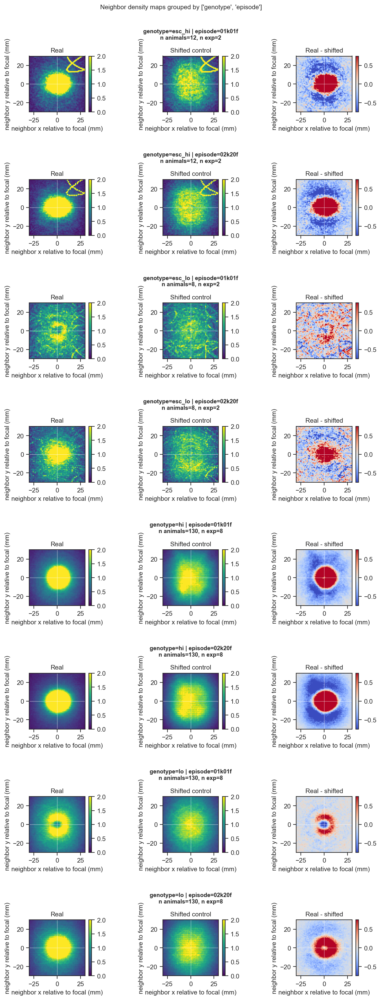

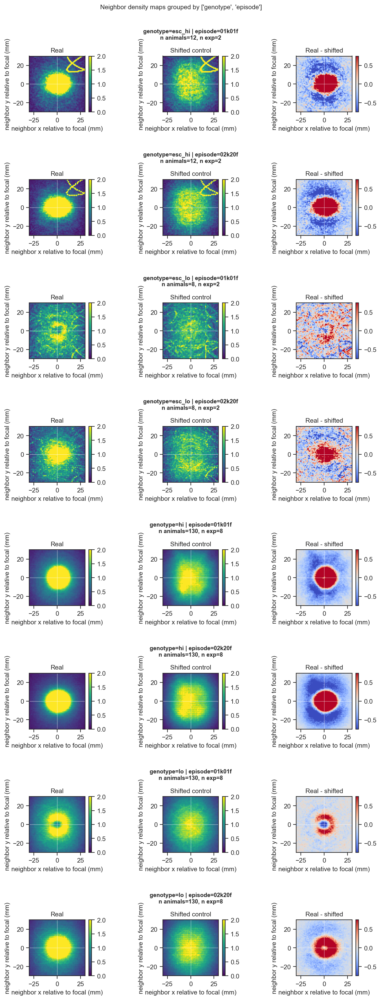

In [35]:
def plot_group_summary(summary, group_cols, output_name, max_rows=None, row_h_pad=2):
    if summary.empty:
        raise ValueError('No grouped maps to plot.')
    plot_data = summary.copy()
    if max_rows is not None:
        plot_data = plot_data.head(max_rows)

    n_rows = len(plot_data)
    fig, axes = plt.subplots(
        n_rows, 3,
        figsize=(9, max(2.8, 2.7 * n_rows)),
        squeeze=False,
        dpi=150
    )

    for row_no, (_, row) in enumerate(plot_data.iterrows()):
        label = group_label(row, group_cols)
        row_title = label + f'\nn animals={row["n_animals"]}, n exp={row["n_experiments"]}'

        panels = [
            ('Real', row['real_map_mean'], 'viridis', REAL_CLIM),
            ('Shifted control', row['shifted_map_mean'], 'viridis', REAL_CLIM),
            ('Real - shifted', row['diff_map_mean'], 'coolwarm', DIFF_CLIM),
        ]

        for col_no, (title, image, cmap, clim) in enumerate(panels):
            ax = axes[row_no, col_no]
            im = ax.imshow(
                image.T,
                origin='lower',
                extent=MAP_EXTENT_MM,
                cmap=cmap,
                vmin=clim[0],
                vmax=clim[1],
            )
            ax.axhline(0, color='white', lw=0.5, alpha=0.7)
            ax.axvline(0, color='white', lw=0.5, alpha=0.7)
            ax.set_aspect('equal')
            ax.set_xlabel('neighbor x relative to focal (mm)')
            ax.set_ylabel('neighbor y relative to focal (mm)')
            ax.set_title(title)
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)


        axes[row_no, 1].text(
        0.5,
        1.28,
        row_title,
        transform=axes[row_no, 1].transAxes,
        ha='center',
        va='bottom',
        fontsize=9,
        fontweight='bold',
        clip_on=False,
        )

        row_axes = axes[row_no, :]
        row_left = row_axes[0].get_position().x0
        row_right = row_axes[-1].get_position().x1
        row_top = max(ax.get_position().y1 for ax in row_axes)

        # fig.text(
        #     (row_left + row_right) / 2,
        #     row_top + 0.025,
        #     row_title,
        #     ha='center',
        #     va='bottom',
        #     fontsize=9,
        #     fontweight='bold'
        # )

    fig.suptitle(
        f'{MAP_TYPE_LABELS.get(MAP_TYPE_INDEX, MAP_TYPE_INDEX)} maps grouped by {group_cols}',
        y=1.002
    )

    fig.tight_layout(h_pad=row_h_pad)
    fig.subplots_adjust(top=0.95)

    output_path = os.path.join(OUTPUT_DIR, output_name)
    fig.savefig(output_path, bbox_inches='tight')
    print('Wrote:', output_path)
    return fig

plot_group_summary(group_summary, GROUP_COLUMNS, 'neighborhood_density_by_' + '_'.join(GROUP_COLUMNS) + '.pdf', row_h_pad=2)

## Optional Alternative Groupings

In [41]:
map_frame_analysis.head()

,animalSet,animalIndex,animalID,CurrentPartner,si,episode,epStart,inDishTime,epiNr,time,...,setup,year,lineSet,basename,summary_path,map_path,map_index,map_type,real_map,shifted_map
525,NaN,771.0,0,35,0.425841,02k20f,135000,85.0,15,85.0,...,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,525,Neighbor density,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
526,NaN,772.0,1,35,0.265509,02k20f,135000,85.0,15,85.0,...,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,526,Neighbor density,"[[0.0, 0.0, 0.0, 0.0, 0.5349325919168213, 1.60...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.57..."
527,NaN,773.0,2,35,0.401162,02k20f,135000,85.0,15,85.0,...,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,527,Neighbor density,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.5264252632778998,..."
528,NaN,774.0,3,35,0.104824,02k20f,135000,85.0,15,85.0,...,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,528,Neighbor density,"[[0.0, 0.6358695240554253, 0.0, 0.0, 0.0, 0.63...","[[1.4090414616470202, 1.4090414616470202, 1.40..."
529,NaN,775.0,4,35,0.385121,02k20f,135000,85.0,15,85.0,...,2,2026,Sel1_10.1_13-02-2026,PositionTxt_allROI2026-02-13T10_15_42,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,//nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsc...,529,Neighbor density,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.5245415690450844, 0.0, 0.5245415..."


Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_density_by_line_genotype_episode.pdf
Wrote: //nasdcsr.unil.ch/RECHERCHE/FAC/FBM/CIG/jlarsch/default/D2c/03_Common_Use//temp/shoaling_selection/ShoalMaps_temp_output/neighborhood_density_by_lineSet_genotype_episode.pdf


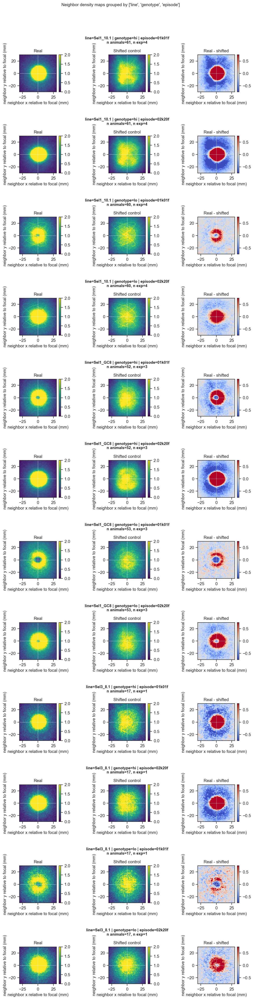

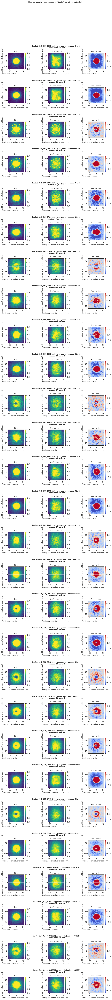

In [46]:

filtered_map_frame_analysis = map_frame_analysis[
    ~map_frame_analysis['genotype'].isin(['esc_hi', 'esc_lo'])
].copy()

for cols in [['line', 'genotype', 'episode'], ['lineSet', 'genotype', 'episode']]:
    if all(col in filtered_map_frame_analysis.columns for col in cols):
        alt_summary = build_group_summary(filtered_map_frame_analysis, cols)
        if not alt_summary.empty:
            export = alt_summary.drop(columns=['real_map_mean', 'shifted_map_mean', 'diff_map_mean'])
            export_name = 'neighborhood_map_group_summary_by_' + '_'.join(cols) + '.csv'
            export.to_csv(os.path.join(OUTPUT_DIR, export_name), index=False)
            plot_group_summary(
                alt_summary,
                cols,
                'neighborhood_density_by_' + '_'.join(cols) + '.pdf',
                max_rows=40
            )